In [1]:
import json
import pandas as pd
from utils import preprocessing, set_index
from matplotlib import pyplot as plt
import numpy as np
from tensorflow.keras import models
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Layer
from tensorflow.keras import backend as K
from tensorflow.keras import optimizers
from dc_vae_continual import DCVAE, Sampling
from utils import samples_conditions_embedd
import pickle
from statsmodels.graphics.tsaplots import plot_acf

2023-06-13 13:29:03.105651: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1


### Settings

In [2]:
settings_path = 'settings/model_settings_continual.txt'
settings = json.load(open(settings_path, 'r'))
print(settings)

{'dataset_name': 'TELCO', 'model_name': 'dc-vae_continual', 'scale': False, 'wo_outliers': True, 'max_std': 7, 'T': 128, 'M': 12, 'cnn_units': [64, 128, 128, 128, 128, 128, 64], 'dil_rate': [1, 2, 4, 8, 16, 32, 64], 'kernel': 2, 'strs': 1, 'activation': 'selu', 'alpha_reg': 0.0001, 'batch_size': 32, 'J': 64, 'epochs': 200, 'lr': 0.0001, 'lr_decay': False, 'decay_rate': 0.96, 'decay_step': 7000, 'val_percent': 0.2, 'time_embedding': False, 'summary': True, 'save_best_model': False, 'save_complete_model': True}


### Train data

In [3]:

#path = '../../Datasets/TELCO/'
path = "/home/gastong/Documentos/TELCO/v1/" #Rosaluna
filenames_train = ["TELCO_data_2021_01.zip", "TELCO_data_2021_02.zip", "TELCO_data_2021_03.zip",
                "TELCO_data_2021_04.zip", "TELCO_data_2021_05.zip", "TELCO_data_2021_06.zip",
                "TELCO_data_2021_07.zip", "TELCO_data_2021_08.zip", "TELCO_data_2021_09.zip",
                "TELCO_data_2021_10.zip", "TELCO_data_2021_11.zip", "TELCO_data_2021_12.zip"]
files_train = [path+ i for i in filenames_train]

# Load data and predictions
# Read CSV files from List
data_train = pd.concat(map(pd.read_csv, files_train))
data_train = set_index(data_train)
data_train = preprocessing(data_train, flag_scaler=False, outliers=True)
data_train.head()

,TS1,TS2,TS3,TS4,TS5,TS6,TS7,TS8,TS9,TS10,TS11,TS12
time,,,,,,,,,,,,
2021-01-01 00:00:00,0.790423,0.572709,0.576859,0.786895,0.845216,0.655201,0.723233,0.795858,0.407110,0.80,0.008386,0.010724
2021-01-01 00:05:00,0.774003,0.540110,0.576859,0.794884,0.843063,0.717850,0.560724,0.650888,0.407110,0.80,0.008386,0.010724
2021-01-01 00:10:00,0.743711,0.532618,0.762395,0.809906,0.826144,0.639912,0.530483,0.618343,0.407110,0.80,0.008386,0.010724
2021-01-01 00:15:00,0.768127,0.517837,0.762395,0.751709,0.834179,0.641776,0.538414,0.603550,0.103483,0.45,0.001316,0.008043
2021-01-01 00:20:00,0.734526,0.495463,0.517999,0.664537,0.908283,1.184732,0.501817,0.568047,0.103483,0.45,0.001316,0.008043


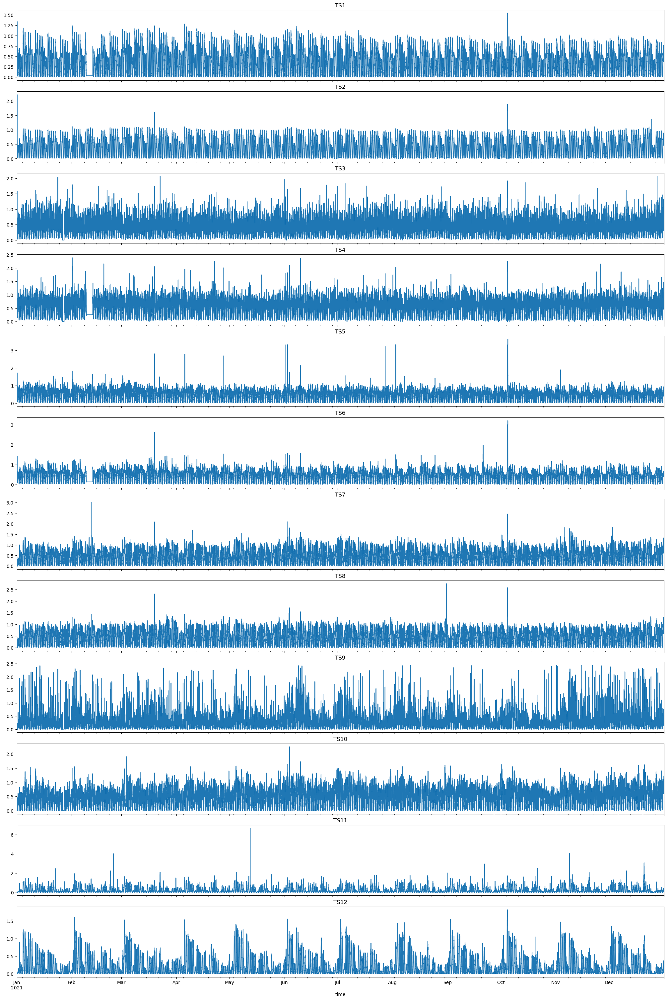

In [4]:
#define number of rows and columns for subplots
nrow=12
ncol=1

columns_list = data_train.columns

time_start = '2021-01-01'
time_end = '2021-12-31'
fig, axes = plt.subplots(nrow, ncol, figsize=(20,30), constrained_layout=True, sharex=True)

# plot counter
count=0

for r in range(nrow):
    for c in range(ncol):
        data_train[columns_list[count]][time_start:time_end].plot(ax=axes[r])
        axes[r].set_title(columns_list[count])
        count+=1

### Test data

In [5]:
#path = '../../Datasets/TELCO/'
path = "/home/gastong/Documentos/TELCO/v1/" #Rosaluna
filenames_test = ["TELCO_data_2022_01.zip", "TELCO_data_2022_02.zip", "TELCO_data_2022_03.zip", "TELCO_data_2022_04.zip",
                  "TELCO_data_2022_05.zip", "TELCO_data_2022_06.zip", "TELCO_data_2022_07.zip", "TELCO_data_2022_08.zip"]
files_test = [path+ i for i in filenames_test]

In [6]:
# Load data and predictions
# Read CSV files from List
data_test = pd.concat(map(pd.read_csv, files_test))
data_test = set_index(data_test)
data_test = preprocessing(data_test, flag_scaler=False, outliers=True)
data_test.head()

,TS1,TS2,TS3,TS4,TS5,TS6,TS7,TS8,TS9,TS10,TS11,TS12
time,,,,,,,,,,,,
2022-01-01 00:00:00,0.648864,0.505284,0.669942,0.837027,0.623184,0.535870,0.634853,0.668639,0.247535,0.875,0.021380,0.021448
2022-01-01 00:05:00,0.649752,0.497994,0.669942,0.820139,0.580578,0.441524,0.590735,0.582840,0.247535,0.875,0.021380,0.021448
2022-01-01 00:10:00,0.593288,0.476937,0.704539,0.777010,0.643936,0.459797,0.548041,0.520710,0.247535,0.875,0.021380,0.021448
2022-01-01 00:15:00,0.544374,0.467724,0.704539,0.835551,0.570099,0.418404,0.556218,0.523669,0.151931,0.575,0.014328,0.016086
2022-01-01 00:20:00,0.611489,0.443933,0.516019,0.795907,0.523654,0.401623,0.632546,0.588757,0.151931,0.575,0.014328,0.016086


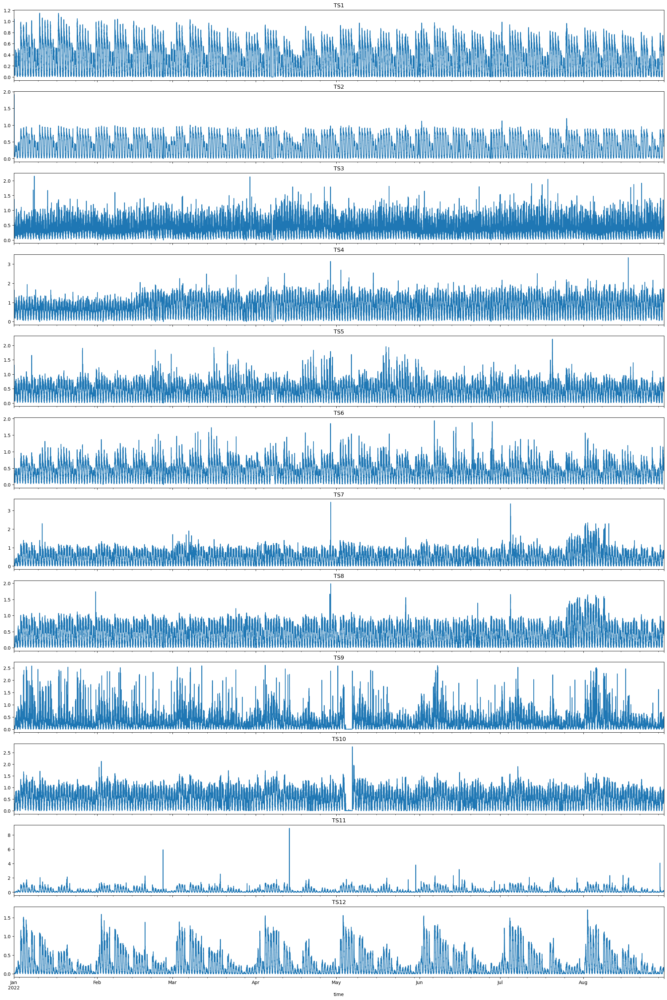

In [7]:
#define number of rows and columns for subplots
nrow=12
ncol=1

columns_list = data_test.columns

time_start = '2022-01-01'
time_end = '2022-08-30'
fig, axes = plt.subplots(nrow, ncol, figsize=(20,30), constrained_layout=True, sharex=True)

# plot counter
count=0

for r in range(nrow):
    for c in range(ncol):
        data_test[columns_list[count]][time_start:time_end].plot(ax=axes[r])
        axes[r].set_title(columns_list[count])
        count+=1

## Predicciones

In [8]:
# Model initialization
model = DCVAE(
    settings['T'],
    settings['M'],
    settings['cnn_units'],
    settings['dil_rate'],
    settings['kernel'],
    settings['strs'],
    settings['batch_size'],
    settings['J'],
    settings['lr'],
    settings['lr_decay'],
    settings['decay_rate'],
    settings['decay_step'],
    settings['time_embedding'],
    settings['summary'],
    ) 

2023-06-13 13:29:32.877719: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


2023-06-13 13:29:32.878531: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2023-06-13 13:29:32.883389: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-06-13 13:29:32.883560: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: NVIDIA TITAN Xp computeCapability: 6.1
coreClock: 1.582GHz coreCount: 30 deviceMemorySize: 11.91GiB deviceMemoryBandwidth: 510.07GiB/s
2023-06-13 13:29:32.883587: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1
2023-06-13 13:29:32.884987: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.10
2023-06-13 13:29:32.885073: I tensorflow/stream_executor/platform/d

Model: "encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_samples (InputLayer)      [(None, 128, 12)]    0                                            
__________________________________________________________________________________________________
dcnn_enc_0 (Conv1D)             (None, 128, 64)      1536        input_samples[0][0]              
__________________________________________________________________________________________________
dcnn_enc_1 (Conv1D)             (None, 128, 128)     16384       dcnn_enc_0[0][0]                 
__________________________________________________________________________________________________
dcnn_enc_2 (Conv1D)             (None, 128, 128)     32768       dcnn_enc_1[0][0]                 
____________________________________________________________________________________________

In [9]:
anom_train, error_train, reconst_train, sig_train, latent_space = model.predict(data_train,
                                        True,
                                        large_result=True,
                                        load_alpha=False,
                                        alpha_set_up = list(np.ones(12)),
                                        alpha_set_down = list(np.ones(12)),
                                        name=settings["model_name"]
                                                    )
th_up_train = reconst_train + sig_train
th_down_train = reconst_train - sig_train

2023-06-13 13:29:34.995724: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:116] None of the MLIR optimization passes are enabled (registered 2)
2023-06-13 13:29:34.996014: I tensorflow/core/platform/profile_utils/cpu_utils.cc:112] CPU Frequency: 3699850000 Hz
2023-06-13 13:29:35.305253: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudnn.so.7
2023-06-13 13:29:35.814901: W tensorflow/stream_executor/gpu/asm_compiler.cc:63] Running ptxas --version returned 256
2023-06-13 13:29:35.894829: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] Internal: ptxas exited with non-zero error code 256, output: 
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.
2023-06-13 13:29:36.651474: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.10


**Series reales con las predicciones de media y sigma**

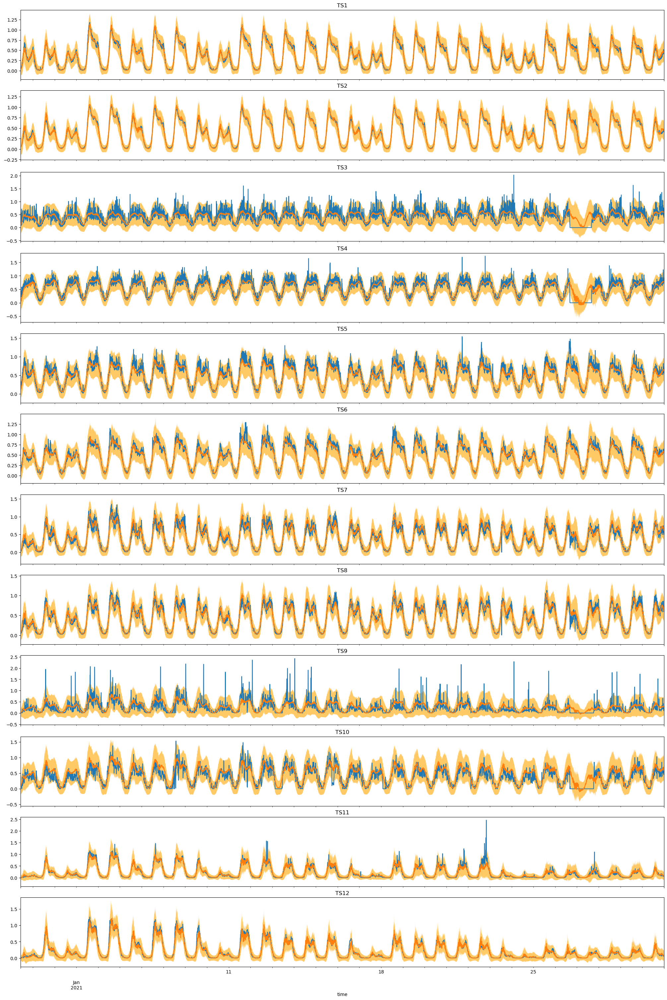

In [10]:
#define number of rows and columns for subplots
nrow=12
ncol=1
data_aux = data_train[reconst_train.index[0]:].copy()

columns_list = data_aux.columns

time_start = '2021-01-01'
time_end = '2021-01-30'
fig, axes = plt.subplots(nrow, ncol, figsize=(20,30), constrained_layout=True, sharex=True)

# plot counter
count=0

for r in range(nrow):
    for c in range(ncol):
        data_aux[columns_list[count]][time_start:time_end].plot(ax=axes[r])
        reconst_train[columns_list[count]][time_start:time_end].plot(ax=axes[r])
        axes[r].fill_between(data_aux[columns_list[count]][time_start:time_end].index,
                         th_up_train[columns_list[count]][time_start:time_end],
                         th_down_train[columns_list[count]][time_start:time_end],
                         facecolor='orange', alpha=0.6, interpolate=True)
        axes[r].set_title(columns_list[count])
        count+=1

In [11]:
anom_test, error_test, reconst_test, sig_test, latent_space = model.predict(data_test,
                                        True,
                                        large_result=True,
                                        load_alpha=False,
                                        alpha_set_up = list(np.ones(12)),
                                        alpha_set_down = list(np.ones(12)),
                                        name=settings["model_name"]
                                                    )
th_up_test = reconst_test + sig_test
th_down_test = reconst_test - sig_test

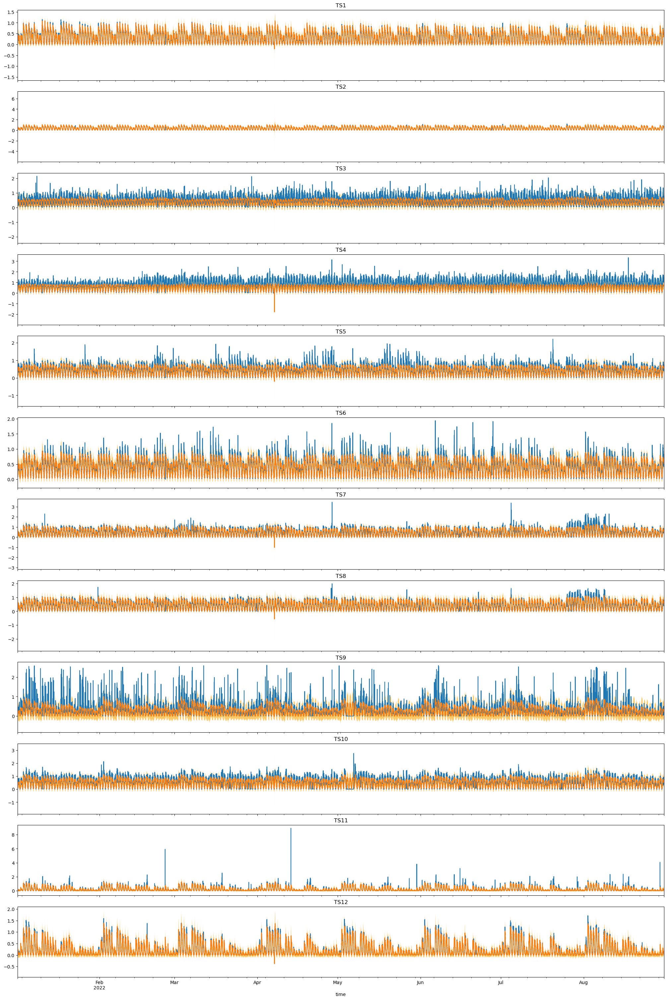

In [12]:
#define number of rows and columns for subplots
nrow=12
ncol=1
data_aux = data_test[reconst_test.index[0]:].copy()

columns_list = data_aux.columns

time_start = '2022-01-01'
time_end = '2022-08-30'
fig, axes = plt.subplots(nrow, ncol, figsize=(20,30), constrained_layout=True, sharex=True)

# plot counter
count=0

for r in range(nrow):
    for c in range(ncol):
        data_aux[columns_list[count]][time_start:time_end].plot(ax=axes[r])
        reconst_test[columns_list[count]][time_start:time_end].plot(ax=axes[r])
        axes[r].fill_between(data_aux[columns_list[count]][time_start:time_end].index,
                         th_up_test[columns_list[count]][time_start:time_end],
                         th_down_test[columns_list[count]][time_start:time_end],
                         facecolor='orange', alpha=0.6, interpolate=True)
        axes[r].set_title(columns_list[count])
        count+=1

### Verosimilitud normalizada

In [13]:
def likelihood_norm(x, mu, sigma):
    return (np.exp(-0.5*((x-mu)/sigma)**2)/(np.sqrt(2*np.pi)*sigma))/(1/(np.sqrt(2*np.pi)*sigma))

### Train

(0.85, 1.02)

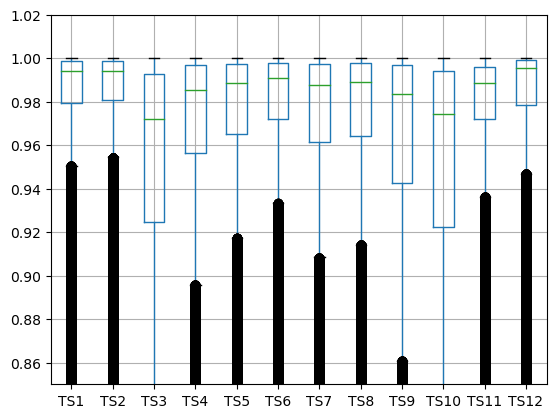

In [14]:
likelihood_train = likelihood_norm(data_train[settings['T']-1:], reconst_train, sig_train)
likelihood_train.boxplot()
plt.ylim([0.85, 1.02])

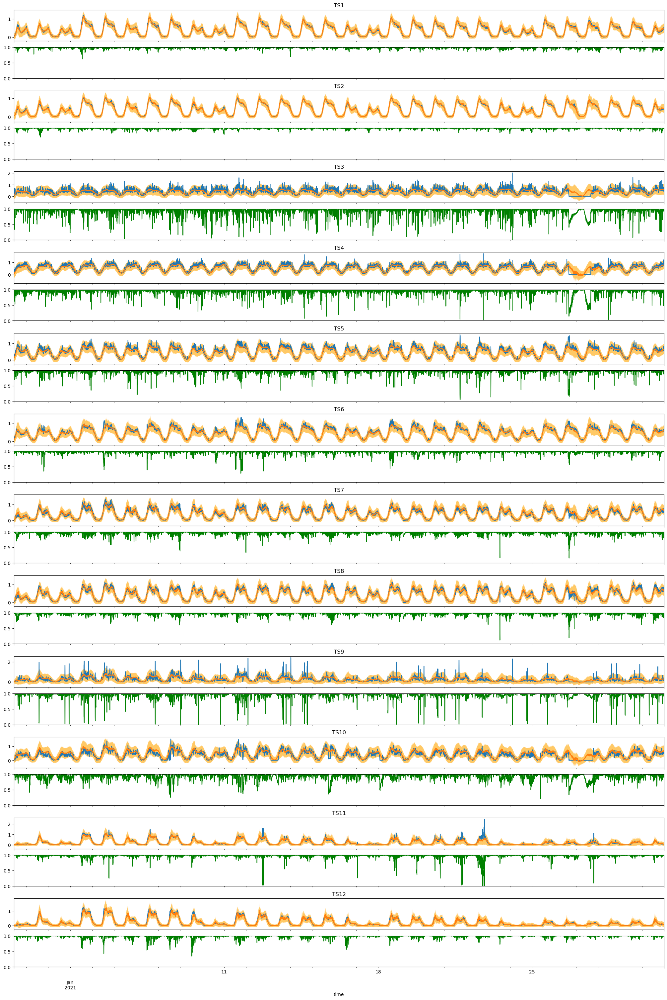

In [15]:
#define number of rows and columns for subplots
nrow=24
ncol=1
data_aux = data_train[reconst_train.index[0]:].copy()

columns_list = data_aux.columns

time_start = '2021-01-01'
time_end = '2021-01-30'
fig, axes = plt.subplots(nrow, ncol, figsize=(20,30), constrained_layout=True, sharex=True)

# plot counter
count=0


for r in range(nrow//2):
    data_aux[columns_list[r]][time_start:time_end].plot(ax=axes[count])
    reconst_train[columns_list[r]][time_start:time_end].plot(ax=axes[count])
    axes[count].fill_between(data_aux[columns_list[r]][time_start:time_end].index,
                        th_up_train[columns_list[r]][time_start:time_end],
                        th_down_train[columns_list[r]][time_start:time_end],
                        facecolor='orange', alpha=0.6, interpolate=True)
    axes[count].set_title(columns_list[r])
    count+=1

    likelihood_train[columns_list[r]][time_start:time_end].plot(ax=axes[count], color='green')
    axes[count].set_ylim([0,1])
    count+=1

### Test

### Test enero febrero CD
Vamos a triplicar los valores de la serie TS1

In [16]:
data_test_janfeb_CD = data_test.copy()[:'2022-02-28']
data_test_janfeb_CD.tail()

,TS1,TS2,TS3,TS4,TS5,TS6,TS7,TS8,TS9,TS10,TS11,TS12
time,,,,,,,,,,,,
2022-02-28 23:35:00,0.457582,0.453146,0.495254,1.292801,0.490672,0.452339,0.669785,0.656805,0.266909,0.85,0.081151,0.091153
2022-02-28 23:40:00,0.438495,0.444642,0.453603,1.136615,0.519579,0.488884,0.664786,0.644970,0.266909,0.85,0.081151,0.091153
2022-02-28 23:45:00,0.444053,0.449096,0.453603,1.204937,0.503612,0.466509,0.559955,0.565089,0.268996,0.40,0.098405,0.096515
2022-02-28 23:50:00,0.494453,0.446261,0.704179,1.227597,0.545782,0.506037,0.615813,0.573964,0.268996,0.40,0.098405,0.096515
2022-02-28 23:55:00,0.463628,0.436036,0.704179,0.995977,0.512211,0.471357,0.488908,0.502959,0.268996,0.40,0.098405,0.096515


In [17]:
data_test_janfeb_CD['TS1'] = 3 * data_test_janfeb_CD['TS1']
data_test_janfeb_CD.tail()

,TS1,TS2,TS3,TS4,TS5,TS6,TS7,TS8,TS9,TS10,TS11,TS12
time,,,,,,,,,,,,
2022-02-28 23:35:00,1.372746,0.453146,0.495254,1.292801,0.490672,0.452339,0.669785,0.656805,0.266909,0.85,0.081151,0.091153
2022-02-28 23:40:00,1.315484,0.444642,0.453603,1.136615,0.519579,0.488884,0.664786,0.644970,0.266909,0.85,0.081151,0.091153
2022-02-28 23:45:00,1.332159,0.449096,0.453603,1.204937,0.503612,0.466509,0.559955,0.565089,0.268996,0.40,0.098405,0.096515
2022-02-28 23:50:00,1.483359,0.446261,0.704179,1.227597,0.545782,0.506037,0.615813,0.573964,0.268996,0.40,0.098405,0.096515
2022-02-28 23:55:00,1.390885,0.436036,0.704179,0.995977,0.512211,0.471357,0.488908,0.502959,0.268996,0.40,0.098405,0.096515


In [18]:
anom_test_janfeb_CD, error_test_janfeb_CD, reconst_test_janfeb_CD, sig_test_janfeb_CD, latent_space = model.predict(data_test_janfeb_CD,
                                        True,
                                        large_result=True,
                                        load_alpha=False,
                                        alpha_set_up = list(np.ones(12)),
                                        alpha_set_down = list(np.ones(12)),
                                        name=settings["model_name"]
                                                    )
th_up_test_janfeb_CD = reconst_test_janfeb_CD + sig_test_janfeb_CD
th_down_test_janfeb_CD = reconst_test_janfeb_CD - sig_test_janfeb_CD

/home/gastong/Documentos/DC-VAE/dc_vae_continual.py:313: RuntimeWarning: overflow encountered in exp
  sig_predict = np.sqrt(np.exp(prediction[1]))


#### Comentarios

Se hacen predicciones donde una serie sufrió un cambio de distribución. Como se puede ver la performance en esta serie se ve deteriorada.

(0.7, 1.02)

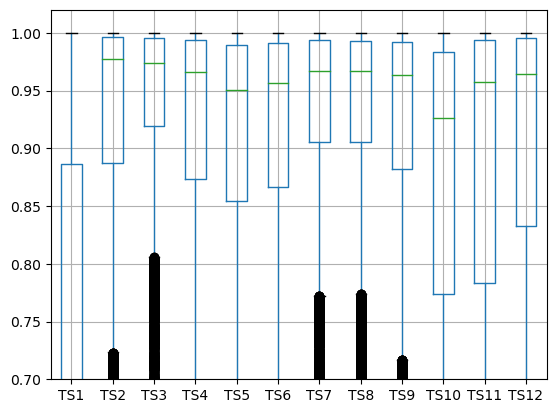

In [19]:
likelihood_test_janfeb_CD = likelihood_norm(data_test_janfeb_CD[settings['T']-1:], reconst_test_janfeb_CD, sig_test_janfeb_CD)

likelihood_test_janfeb_CD.boxplot()
plt.ylim([0.70, 1.02])

In [20]:
likelihood_test_janfeb_CD.quantile([0.25, 0.5, 0.75])

,TS1,TS2,TS3,TS4,TS5,TS6,TS7,TS8,TS9,TS10,TS11,TS12
0.25,0.139570,0.887070,0.919349,0.873712,0.854395,0.866184,0.905113,0.905399,0.882132,0.774013,0.783342,0.832549
0.50,0.532107,0.977349,0.973902,0.965937,0.950156,0.956331,0.966993,0.967243,0.963418,0.926210,0.957534,0.964726
0.75,0.886442,0.996361,0.995114,0.994109,0.988985,0.991120,0.993726,0.993050,0.992338,0.983692,0.993437,0.995614


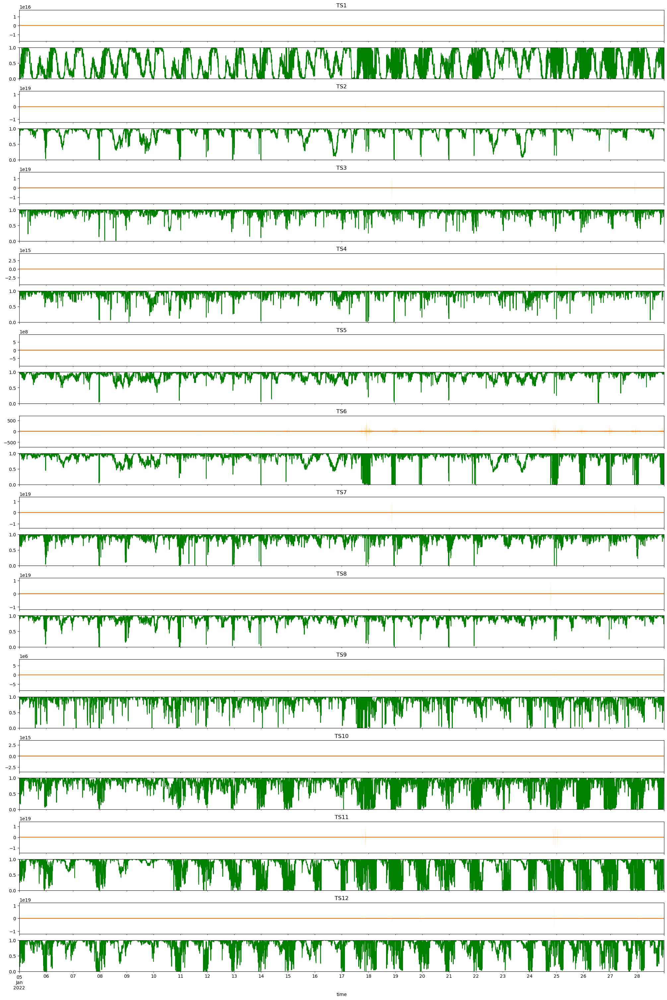

In [21]:
#define number of rows and columns for subplots
nrow=24
ncol=1
data_aux = data_test_janfeb_CD[reconst_test_janfeb_CD.index[0]:].copy()

columns_list = data_aux.columns

time_start = '2022-01-05'
time_end = '2022-01-28'
fig, axes = plt.subplots(nrow, ncol, figsize=(20,30), constrained_layout=True, sharex=True)

# plot counter
count=0


for r in range(nrow//2):
    data_aux[columns_list[r]][time_start:time_end].plot(ax=axes[count])
    reconst_test_janfeb_CD[columns_list[r]][time_start:time_end].plot(ax=axes[count])
    axes[count].fill_between(data_aux[columns_list[r]][time_start:time_end].index,
                        th_up_test_janfeb_CD[columns_list[r]][time_start:time_end],
                        th_down_test_janfeb_CD[columns_list[r]][time_start:time_end],
                        facecolor='orange', alpha=0.6, interpolate=True)
    axes[count].set_title(columns_list[r])
    count+=1

    likelihood_test_janfeb_CD[columns_list[r]][time_start:time_end].plot(ax=axes[count], color='green')
    axes[count].set_ylim([0,1])
    count+=1

#### Comentarios
Ahora se ajustan los pesos del modelo con los datos nuevos con CD. 

In [22]:
model_to_ft = DCVAE(
    settings['T'],
    settings['M'],
    settings['cnn_units'],
    settings['dil_rate'],
    settings['kernel'],
    settings['strs'],
    settings['batch_size'],
    settings['J'],
    settings['lr'],
    settings['lr_decay'],
    settings['decay_rate'],
    settings['decay_step'],
    settings['time_embedding'],
    settings['summary'],
    ) 

# Compilation
opt = optimizers.Adam(learning_rate=settings['lr'])
model_to_ft.vae.compile(optimizer=opt)


Model: "encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_samples (InputLayer)      [(None, 128, 12)]    0                                            
__________________________________________________________________________________________________
dcnn_enc_0 (Conv1D)             (None, 128, 64)      1536        input_samples[0][0]              
__________________________________________________________________________________________________
dcnn_enc_1 (Conv1D)             (None, 128, 128)     16384       dcnn_enc_0[0][0]                 
__________________________________________________________________________________________________
dcnn_enc_2 (Conv1D)             (None, 128, 128)     32768       dcnn_enc_1[0][0]                 
____________________________________________________________________________________________

In [23]:
model_to_ft.fit(data_test_janfeb_CD,
    settings['val_percent'],
    settings['epochs'],
    settings['model_name']+'_ft',
    settings['save_best_model'],
    True)

Epoch 1/200
422/422 [==============================] - 58s 91ms/step - loss: 3.1806 - reconst: 1.0008 - kl: 0.3340 - val_loss: 0.4228 - val_reconst: 0.1829 - val_kl: 0.2399
Epoch 2/200
422/422 [==============================] - 6s 15ms/step - loss: 0.2497 - reconst: -0.1143 - kl: 0.2199 - val_loss: -0.1470 - val_reconst: -0.3503 - val_kl: 0.2032
Epoch 3/200
422/422 [==============================] - 6s 15ms/step - loss: -0.2274 - reconst: -0.5005 - kl: 0.1964 - val_loss: -0.4363 - val_reconst: -0.6273 - val_kl: 0.1911
Epoch 4/200
422/422 [==============================] - 6s 15ms/step - loss: -0.4946 - reconst: -0.7537 - kl: 0.2020 - val_loss: -0.6518 - val_reconst: -0.8619 - val_kl: 0.2101
Epoch 5/200
422/422 [==============================] - 6s 15ms/step - loss: -0.7023 - reconst: -0.9638 - kl: 0.2195 - val_loss: -0.8208 - val_reconst: -1.0478 - val_kl: 0.2270
Epoch 6/200
422/422 [==============================] - 6s 14ms/step - loss: -0.8558 - reconst: -1.1148 - kl: 0.2304 - val_lo

In [24]:
anom_test_janfeb_CD_ft, error_test_janfeb_CD_ft, reconst_test_janfeb_CD_ft, sig_test_janfeb_CD_ft, laten_test_space_janfeb_CD_ft = model_to_ft.predict(data_test_janfeb_CD,
                                        True,
                                        large_result=True,
                                        load_alpha=False,
                                        alpha_set_up = list(np.ones(12)),
                                        alpha_set_down = list(np.ones(12)),
                                        name=settings["model_name"]+'_ft'
                                                    )
th_up_test_janfeb_CD_ft = reconst_test_janfeb_CD_ft + sig_test_janfeb_CD_ft
th_down_test_janfeb_CD_ft = reconst_test_janfeb_CD_ft - sig_test_janfeb_CD_ft

#### Comentarios
Como se puede ver la performance mejoró para todas las series.

(0.7, 1.02)

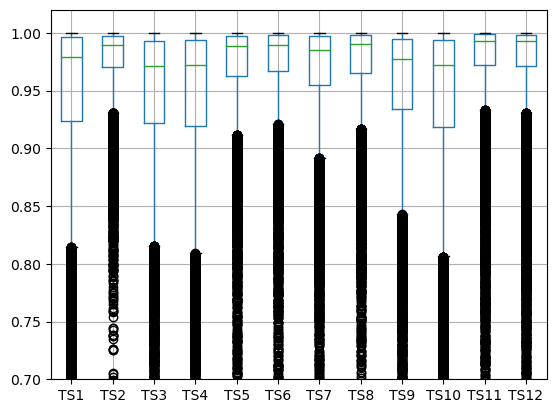

In [25]:
likelihood_test_janfeb_CD_ft = likelihood_norm(data_test_janfeb_CD[settings['T']-1:], reconst_test_janfeb_CD_ft, sig_test_janfeb_CD_ft)

likelihood_test_janfeb_CD_ft.boxplot()
plt.ylim([0.70, 1.02])

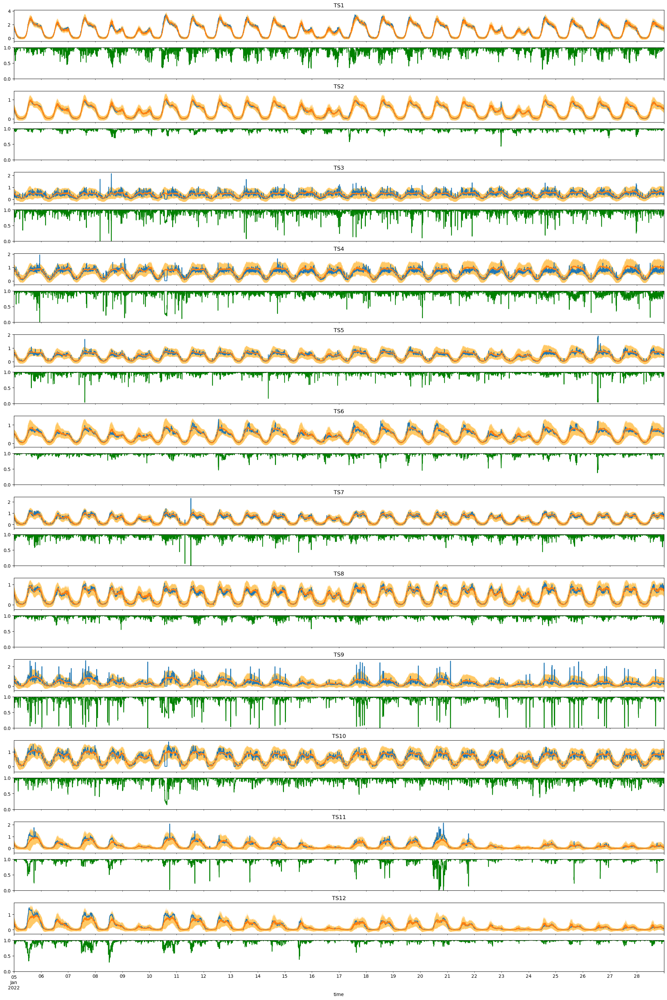

In [26]:
#define number of rows and columns for subplots
nrow=24
ncol=1
data_aux = data_test_janfeb_CD[reconst_test_janfeb_CD_ft.index[0]:].copy()

columns_list = data_aux.columns

time_start = '2022-01-05'
time_end = '2022-01-28'
fig, axes = plt.subplots(nrow, ncol, figsize=(20,30), constrained_layout=True, sharex=True)

# plot counter
count=0


for r in range(nrow//2):
    data_aux[columns_list[r]][time_start:time_end].plot(ax=axes[count])
    reconst_test_janfeb_CD_ft[columns_list[r]][time_start:time_end].plot(ax=axes[count])
    axes[count].fill_between(data_aux[columns_list[r]][time_start:time_end].index,
                        th_up_test_janfeb_CD_ft[columns_list[r]][time_start:time_end],
                        th_down_test_janfeb_CD_ft[columns_list[r]][time_start:time_end],
                        facecolor='orange', alpha=0.6, interpolate=True)
    axes[count].set_title(columns_list[r])
    count+=1

    likelihood_test_janfeb_CD_ft[columns_list[r]][time_start:time_end].plot(ax=axes[count], color='green')
    axes[count].set_ylim([0,1])
    count+=1

In [27]:
anom_train_ft, error_train_ft, reconst_train_ft, sig_train_ft, laten_train_ft = model_to_ft.predict(data_train,
                                        False,
                                        large_result=True,
                                        load_alpha=False,
                                        alpha_set_up = list(np.ones(12)),
                                        alpha_set_down = list(np.ones(12)),
                                        name=settings["model_name"]+'_ft'
                                                    )
th_up_train_ft = reconst_train_ft + sig_train_ft
th_down_train_ft = reconst_train_ft - sig_train_ft

#### Comentarios
Al volver a probar el nuevo modelo con los datos de entrenamiento vemos que la performance de las predicciones empeoró sobre todo para la serie en cuestión pero también para las otras series.

(0.85, 1.02)

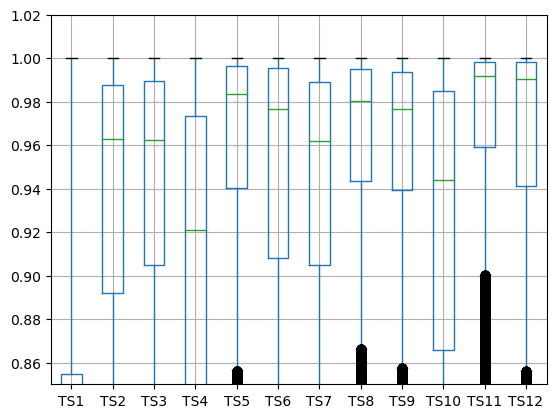

In [28]:
likelihood_train_ft = likelihood_norm(data_train[settings['T']-1:], reconst_train_ft, sig_train_ft)
likelihood_train_ft.boxplot()
plt.ylim([0.85, 1.02])

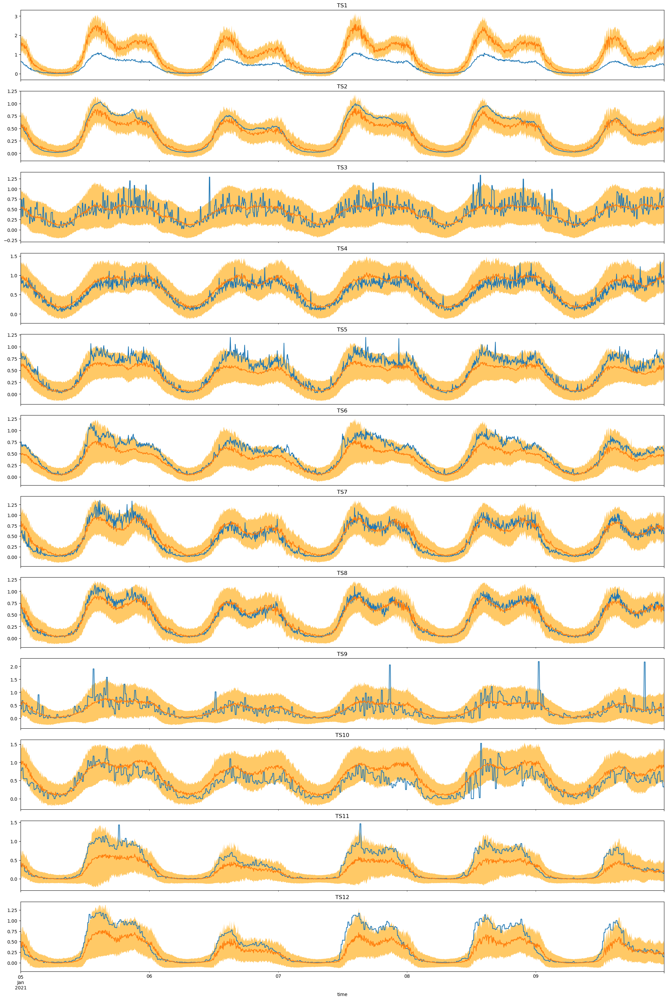

In [104]:
#define number of rows and columns for subplots
nrow=12
ncol=1
data_aux = data_train[reconst_train_ft.index[0]:].copy()

columns_list = data_aux.columns

time_start = '2021-01-05'
time_end = '2021-01-09'
fig, axes = plt.subplots(nrow, ncol, figsize=(20,30), constrained_layout=True, sharex=True)

# plot counter
count=0

for r in range(nrow):
    for c in range(ncol):
        data_aux[columns_list[count]][time_start:time_end].plot(ax=axes[r])
        reconst_train_ft[columns_list[count]][time_start:time_end].plot(ax=axes[r])
        axes[r].fill_between(data_aux[columns_list[count]][time_start:time_end].index,
                         th_up_train_ft[columns_list[count]][time_start:time_end],
                         th_down_train_ft[columns_list[count]][time_start:time_end],
                         facecolor='orange', alpha=0.6, interpolate=True)
        axes[r].set_title(columns_list[count])
        count+=1

### Generación de muestras

In [1]:
noise = np.random.normal(0, 1, (data_test_janfeb_CD.shape[0], 1, settings['J']))
print(noise.shape)

NameError: name 'np' is not defined

In [2]:
np.quantile(noise, q=0.98)

NameError: name 'np' is not defined

In [31]:
decoder = keras.models.load_model(settings['model_name']+'_decoder.h5',
                                                custom_objects={'sampling': Sampling},
                                                compile = True)

In [62]:
mu_gen, log_var_gen = decoder.predict(noise)
sig_gen = np.sqrt(np.exp(log_var_gen))
th_up_gen = mu_gen + sig_gen
th_down_gen = mu_gen - sig_gen

noise2gen = np.random.normal(0, 1, (mu_gen.shape[0], settings['T'], settings['M']))
X_gen = mu_gen + noise2gen*(th_up_gen-mu_gen)

In [63]:
X_gen = np.where(X_gen > 0, X_gen, 0)

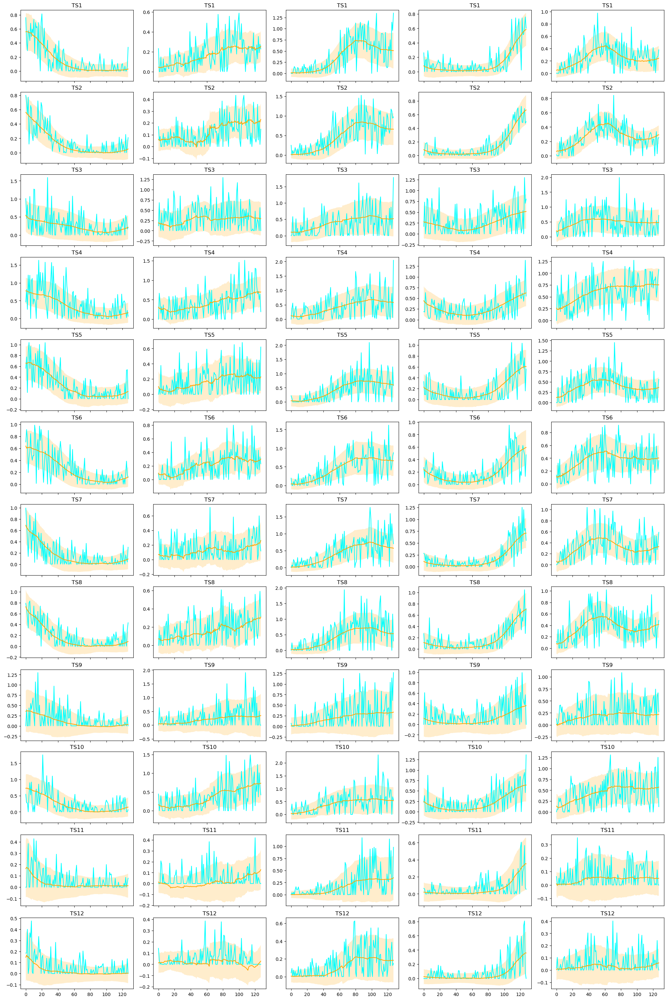

In [64]:
#define number of rows and columns for subplots
nrow=12
ncol=5

offset = 64

columns_list = data_aux.columns

fig, axes = plt.subplots(nrow, ncol, figsize=(20,30), constrained_layout=True, sharex=True)

# plot counter
count=0

for r in range(nrow):
    for c in range(ncol):
        axes[r, c].plot(X_gen[c+offset,:,r], c='cyan')
        axes[r, c].plot(mu_gen[c+offset,:,r], c='orange')
        axes[r, c].fill_between(np.arange(settings['T']),
                         th_up_gen[c+offset,:,r],
                         th_down_gen[c+offset,:,r],
                         facecolor='orange', alpha=0.2, interpolate=True)
        axes[r, c].set_title(columns_list[r])
        count+=1

In [120]:
model_to_GR = DCVAE(
    settings['T'],
    settings['M'],
    settings['cnn_units'],
    settings['dil_rate'],
    settings['kernel'],
    settings['strs'],
    settings['batch_size'],
    settings['J'],
    settings['lr'],
    settings['lr_decay'],
    settings['decay_rate'],
    settings['decay_step'],
    settings['time_embedding'],
    settings['summary'],
    ) 

# Compilation
opt = optimizers.Adam(learning_rate=settings['lr'])
model_to_GR.vae.compile(optimizer=opt)

Model: "encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_samples (InputLayer)      [(None, 128, 12)]    0                                            
__________________________________________________________________________________________________
dcnn_enc_0 (Conv1D)             (None, 128, 64)      1536        input_samples[0][0]              
__________________________________________________________________________________________________
dcnn_enc_1 (Conv1D)             (None, 128, 128)     16384       dcnn_enc_0[0][0]                 
__________________________________________________________________________________________________
dcnn_enc_2 (Conv1D)             (None, 128, 128)     32768       dcnn_enc_1[0][0]                 
____________________________________________________________________________________________

In [118]:
X_gen.shape

(16992, 128, 12)

In [121]:
model_to_GR.fit(data_test_janfeb_CD,
    settings['val_percent'],
    settings['epochs'],
    settings['model_name']+'_GR',
    settings['save_best_model'],
    settings['save_complete_model'],
    X_gen[-3400:])

Epoch 1/200
507/507 [==============================] - 9s 16ms/step - loss: 1.3274 - reconst: 0.1419 - kl: 0.2999 - val_loss: -0.3205 - val_reconst: -0.5260 - val_kl: 0.2056
Epoch 2/200
507/507 [==============================] - 8s 15ms/step - loss: -0.4371 - reconst: -0.7465 - kl: 0.2082 - val_loss: -0.7033 - val_reconst: -0.9119 - val_kl: 0.2087
Epoch 3/200
507/507 [==============================] - 8s 15ms/step - loss: -0.7480 - reconst: -1.0065 - kl: 0.2145 - val_loss: -0.8615 - val_reconst: -1.0876 - val_kl: 0.2260
Epoch 4/200
507/507 [==============================] - 8s 15ms/step - loss: -0.9002 - reconst: -1.1451 - kl: 0.2212 - val_loss: -0.9972 - val_reconst: -1.2157 - val_kl: 0.2185
Epoch 5/200
507/507 [==============================] - 8s 15ms/step - loss: -1.0076 - reconst: -1.2500 - kl: 0.2245 - val_loss: -1.0574 - val_reconst: -1.2738 - val_kl: 0.2164
Epoch 6/200
507/507 [==============================] - 8s 15ms/step - loss: -1.0833 - reconst: -1.3310 - kl: 0.2218 - val_

In [122]:
anom_test_janfeb_CD_GR, error_test_janfeb_CD_GR, reconst_test_janfeb_CD_GR, sig_test_janfeb_CD_GR, laten_test_space_janfeb_CD_GR = model_to_GR.predict(data_test_janfeb_CD,
                                        True,
                                        large_result=True,
                                        load_alpha=False,
                                        alpha_set_up = list(np.ones(12)),
                                        alpha_set_down = list(np.ones(12)),
                                        name=settings["model_name"]+'_GR'
                                                    )
th_up_test_janfeb_CD_GR = reconst_test_janfeb_CD_GR + sig_test_janfeb_CD_GR
th_down_test_janfeb_CD_GR = reconst_test_janfeb_CD_GR - sig_test_janfeb_CD_GR

(0.7, 1.02)

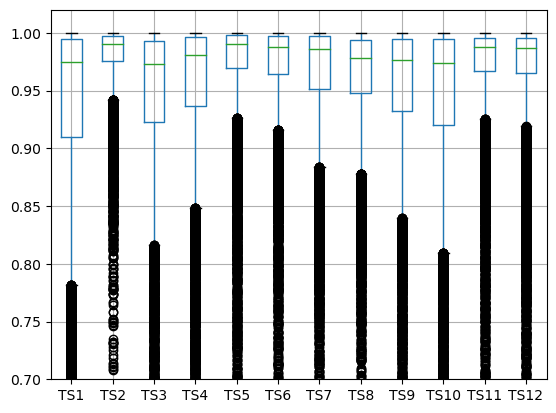

In [123]:
likelihood_test_janfeb_CD_GR = likelihood_norm(data_test_janfeb_CD[settings['T']-1:], reconst_test_janfeb_CD_GR, sig_test_janfeb_CD_GR)

likelihood_test_janfeb_CD_GR.boxplot()
plt.ylim([0.70, 1.02])


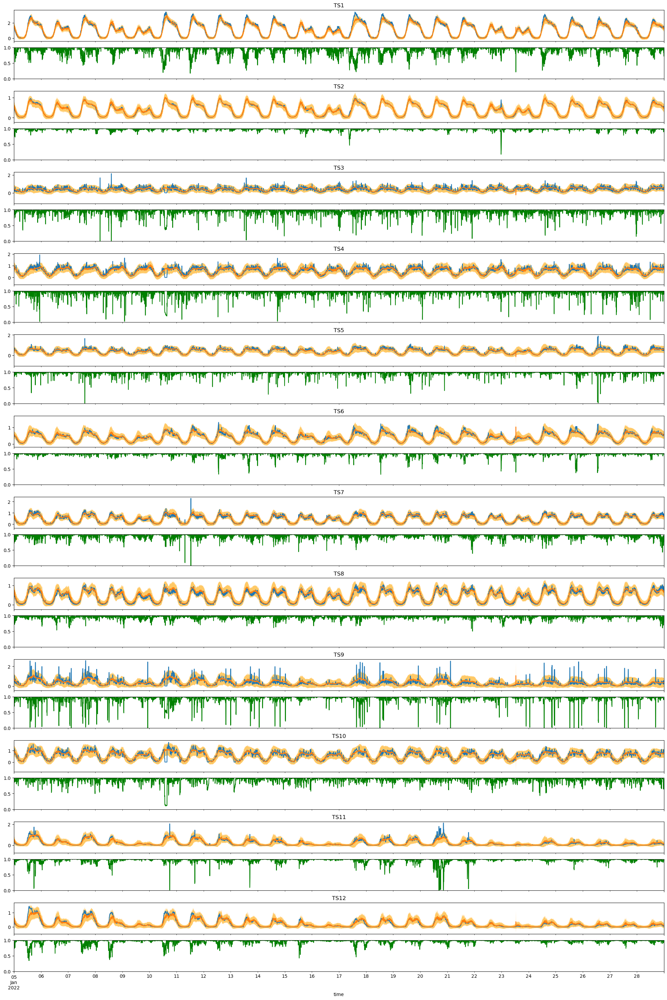

In [124]:
#define number of rows and columns for subplots
nrow=24
ncol=1
data_aux = data_test_janfeb_CD[reconst_test_janfeb_CD_GR.index[0]:].copy()

columns_list = data_aux.columns

time_start = '2022-01-05'
time_end = '2022-01-28'
fig, axes = plt.subplots(nrow, ncol, figsize=(20,30), constrained_layout=True, sharex=True)

# plot counter
count=0


for r in range(nrow//2):
    data_aux[columns_list[r]][time_start:time_end].plot(ax=axes[count])
    reconst_test_janfeb_CD_GR[columns_list[r]][time_start:time_end].plot(ax=axes[count])
    axes[count].fill_between(data_aux[columns_list[r]][time_start:time_end].index,
                        th_up_test_janfeb_CD_GR[columns_list[r]][time_start:time_end],
                        th_down_test_janfeb_CD_GR[columns_list[r]][time_start:time_end],
                        facecolor='orange', alpha=0.6, interpolate=True)
    axes[count].set_title(columns_list[r])
    count+=1

    likelihood_test_janfeb_CD_GR[columns_list[r]][time_start:time_end].plot(ax=axes[count], color='green')
    axes[count].set_ylim([0,1])
    count+=1

In [125]:
anom_train_GR, error_train_GR, reconst_train_GR, sig_train_GR, laten_train_GR = model_to_GR.predict(data_train,
                                        False,
                                        large_result=True,
                                        load_alpha=False,
                                        alpha_set_up = list(np.ones(12)),
                                        alpha_set_down = list(np.ones(12)),
                                        name=settings["model_name"]+'_GR'
                                                    )
th_up_train_GR = reconst_train_GR + sig_train_GR
th_down_train_GR = reconst_train_GR - sig_train_GR

(0.85, 1.02)

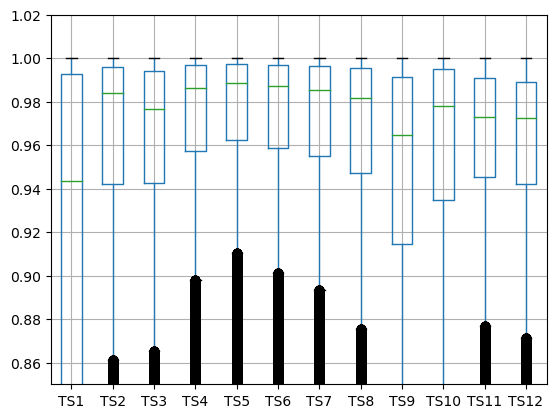

In [126]:
likelihood_train_GR = likelihood_norm(data_train[settings['T']-1:], reconst_train_GR, sig_train_GR)
likelihood_train_GR.boxplot()
plt.ylim([0.85, 1.02])

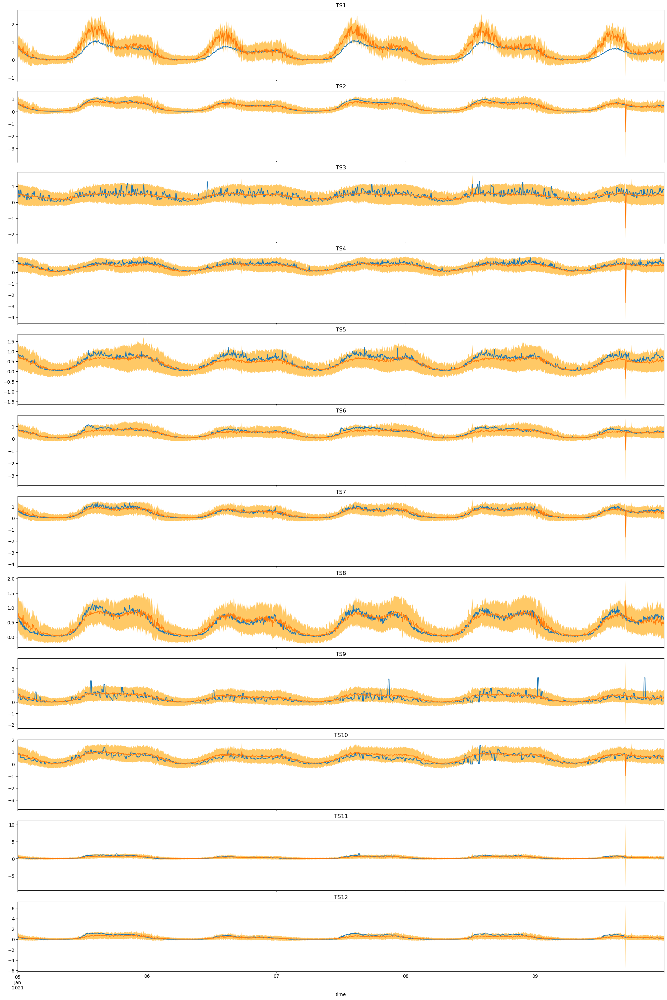

In [127]:
#define number of rows and columns for subplots
nrow=12
ncol=1
data_aux = data_train[reconst_train_GR.index[0]:].copy()

columns_list = data_aux.columns

time_start = '2021-01-05'
time_end = '2021-01-09'
fig, axes = plt.subplots(nrow, ncol, figsize=(20,30), constrained_layout=True, sharex=True)

# plot counter
count=0

for r in range(nrow):
    for c in range(ncol):
        data_aux[columns_list[count]][time_start:time_end].plot(ax=axes[r])
        reconst_train_GR[columns_list[count]][time_start:time_end].plot(ax=axes[r])
        axes[r].fill_between(data_aux[columns_list[count]][time_start:time_end].index,
                         th_up_train_GR[columns_list[count]][time_start:time_end],
                         th_down_train_GR[columns_list[count]][time_start:time_end],
                         facecolor='orange', alpha=0.6, interpolate=True)
        axes[r].set_title(columns_list[count])
        count+=1